# Library imports

In [45]:
# Data manipulation
import pandas as pd

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt


# Colab
#from google.colab import drive

# System
import os

# Random number generation
import random

from keras._tf_keras.keras.preprocessing import image

> Mount Google Drive

In [46]:
#drive.mount('/content/drive')

# Data loading

In [47]:
# Current working directory
current_dir = os.getcwd()

# Parent directory
parent_dir = os.path.dirname(current_dir)

# Path to metadata CSV
metadata_path = os.path.join(parent_dir, 'data\\species_metadata.csv')

# Load the metadata
df = pd.read_csv(metadata_path)

# Display the first few rows of the dataframe
df.head()

,rare_species_id,eol_content_id,eol_page_id,kingdom,phylum,family,file_path
0,75fd91cb-2881-41cd-88e6-de451e8b60e2,12853737,449393,animalia,mollusca,unionidae,mollusca_unionidae/12853737_449393_eol-full-si...
1,28c508bc-63ff-4e60-9c8f-1934367e1528,20969394,793083,animalia,chordata,geoemydidae,chordata_geoemydidae/20969394_793083_eol-full-...
2,00372441-588c-4af8-9665-29bee20822c0,28895411,319982,animalia,chordata,cryptobranchidae,chordata_cryptobranchidae/28895411_319982_eol-...
3,29cc6040-6af2-49ee-86ec-ab7d89793828,29658536,45510188,animalia,chordata,turdidae,chordata_turdidae/29658536_45510188_eol-full-s...
4,94004bff-3a33-4758-8125-bf72e6e57eab,21252576,7250886,animalia,chordata,indriidae,chordata_indriidae/21252576_7250886_eol-full-s...


# Data exploration

## General Insights

In [48]:
# Count samples per family
class_counts = df['family'].value_counts()

# Most and least common families
print(f"Most common family: {class_counts.index[0]} ({class_counts.iloc[0]} samples)")
print(f"Least common family: {class_counts.index[-1]} ({class_counts.iloc[-1]} samples)")

# Imbalance analysis
print(f"\nImbalance ratio: {class_counts.iloc[0]/class_counts.iloc[-1]:.1f}x")

# Display the number of unique families and phila
print(f"\nThere are {len(class_counts)} unique families and {len(df['phylum'].unique())} unique phyla in the dataset and a total of {len(df)} samples")

Most common family: dactyloidae (300 samples)
Least common family: siluridae (29 samples)

Imbalance ratio: 10.3x

There are 202 unique families and 5 unique phyla in the dataset and a total of 11983 samples


## Top 20 families distribution

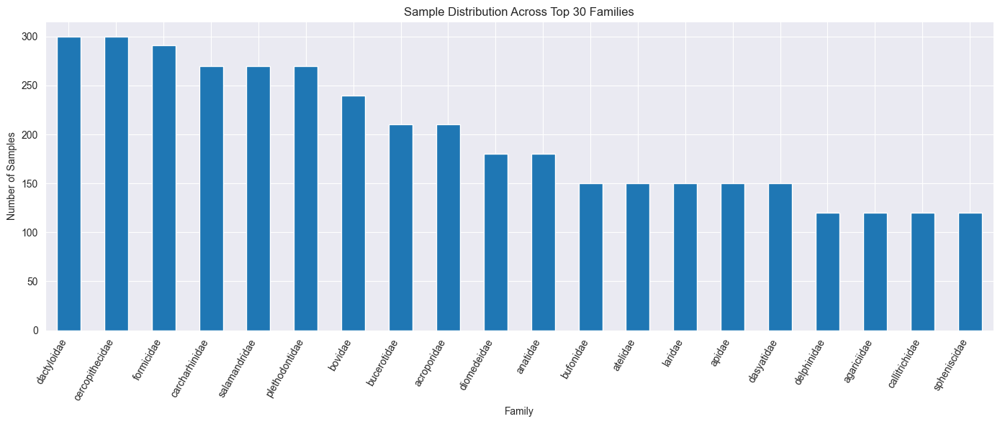

In [49]:
# Plot distribution
plt.figure(figsize=(14, 6))
class_counts[:20].plot(kind='bar')
plt.title('Sample Distribution Across Top 30 Families')
plt.ylabel('Number of Samples')
plt.xlabel('Family')
plt.xticks(rotation=60, ha='right')
plt.tight_layout()
plt.show()

## Philum distribution

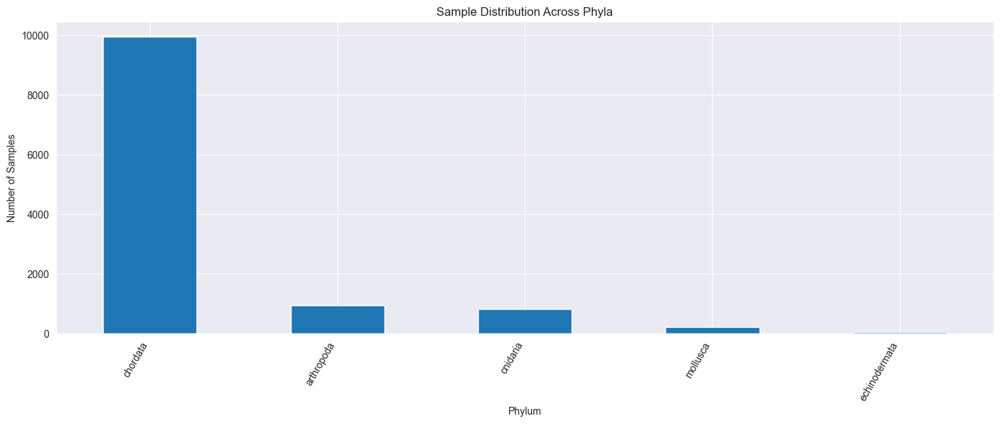

In [50]:
# Count samples per phylum
class_counts = df['phylum'].value_counts()

# Plot distribution
plt.figure(figsize=(14, 6))
class_counts.plot(kind='bar')
plt.title('Sample Distribution Across Phyla')
plt.ylabel('Number of Samples')
plt.xlabel('Phylum')
plt.xticks(rotation=60, ha='right')
plt.tight_layout()
plt.show()

## Loading Images for different Phylum

In [152]:
# Training directory path
train_dir = os.path.join(os.path.dirname(parent_dir), 'train')

# Function to load and display image sample for a given phylum
def visualize_samples_by_phylum(train_dir, phylum, num_classes=3, samples_per_class=4):
    # Filtering the dataframe for the given phylum
    phylum_df = df[df['phylum'] == phylum]

    # Getting the list of families (classes) for the given phylum
    class_dirs = phylum_df['family'].unique()

    # Setting a random seed for reproducibility
    random.seed(20)

    # Some classes are sampled randomly according to the number of classes specified
    if len(class_dirs) > num_classes:
        class_dirs = random.sample(list(class_dirs), num_classes)
    # If the phylum has fewer classes than num_classes, use all available classes
    else:
        num_classes = len(class_dirs)

    plt.figure(figsize=(4 * samples_per_class, 4 * num_classes))

    for i, class_dir in enumerate(class_dirs):
        class_path = os.path.join(train_dir, class_dir)
        if not os.path.exists(class_path):
            print(f"Directory not found for family: {class_dir}")
            continue

        # Getting the list of image files for the class
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        # Randomly sample some images
        if len(image_files) > samples_per_class:
            image_files = random.sample(image_files, samples_per_class)
        # If there are too few images, use all available images
        else:
            samples_per_class = len(image_files)

        # Displaying images for this class
        for j, img_file in enumerate(image_files):
            img_path = os.path.join(class_path, img_file)

            # Loading and displaying the image
            img = image.load_img(img_path, target_size=(224, 224))
            # Normalizing the image
            img_array = image.img_to_array(img) / 255.0

            # Creating a subplot for each image
            plt.subplot(num_classes, samples_per_class, i * samples_per_class + j + 1)
            plt.imshow(img_array)

            # Only show class name for the first image in each row
            if j == 0:
                plt.title(f'\nFamily: {class_dir}', fontsize=16, pad=10, color='blue', weight='bold', loc='left')
            plt.axis('off')

    plt.tight_layout()
    plt.suptitle(f'Sample Images from Phylum: {phylum}', fontsize=35)
    plt.subplots_adjust(top=0.9)  # Make room for subtitle
    plt.show()

## Mollusca

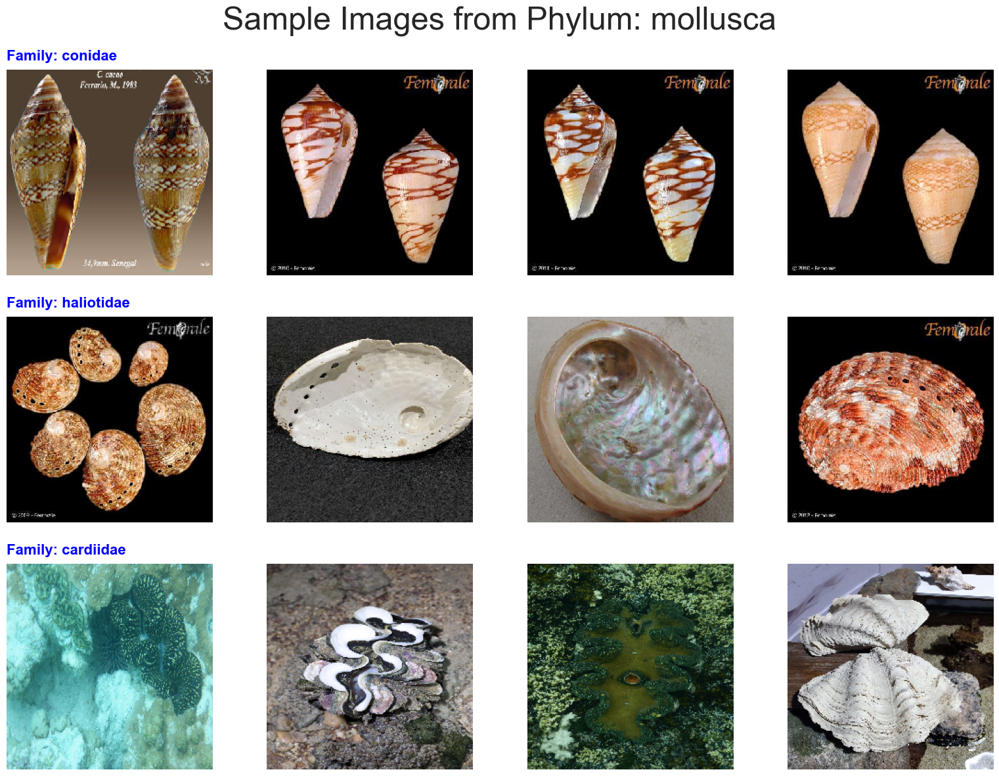

In [153]:
visualize_samples_by_phylum(train_dir, 'mollusca')

## Chordata

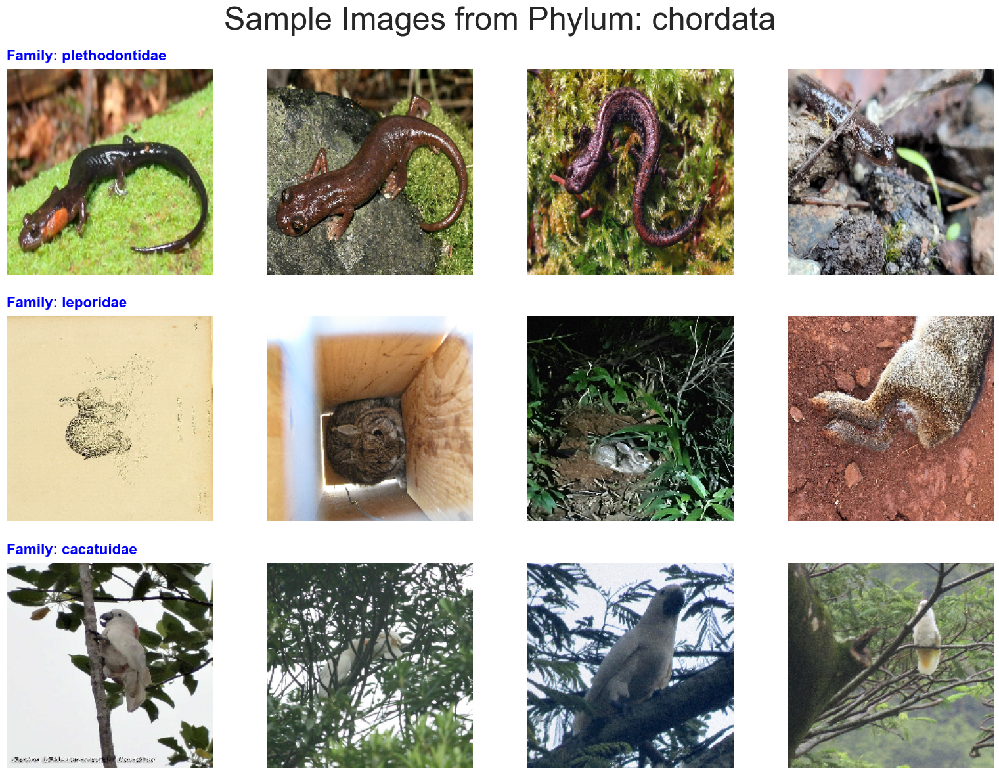

In [154]:
visualize_samples_by_phylum(train_dir, 'chordata')

## Arthropoda

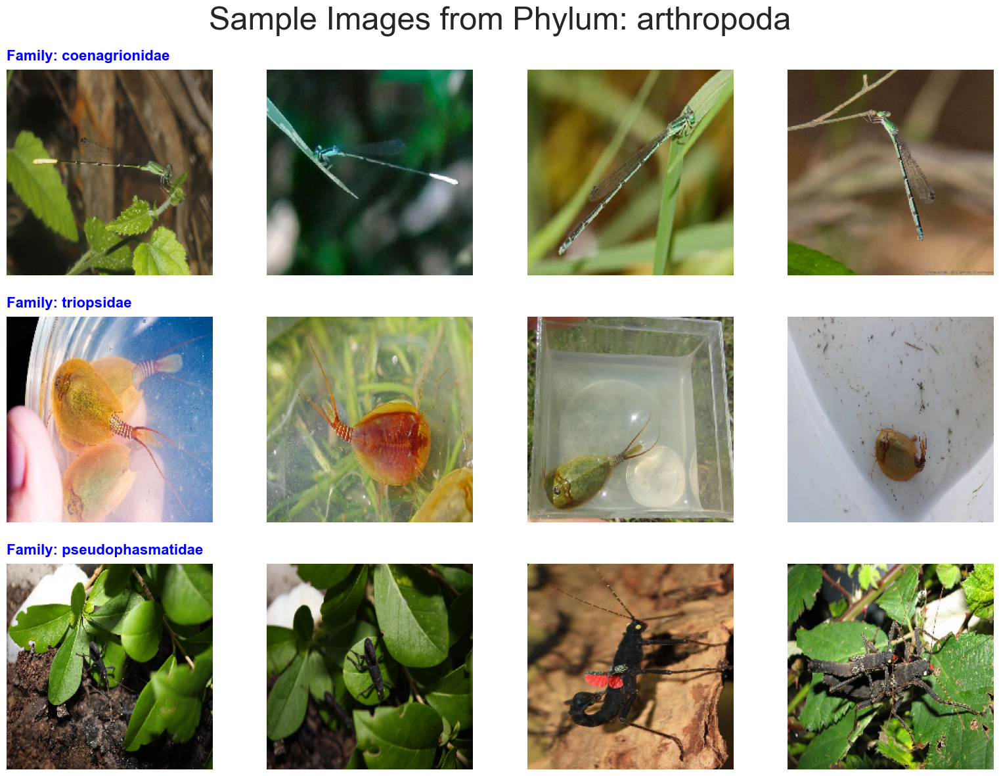

In [155]:
visualize_samples_by_phylum(train_dir, 'arthropoda')

## Echinodermata

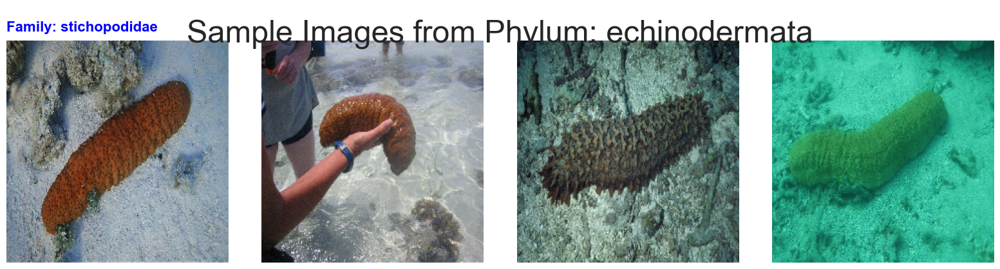

In [156]:
visualize_samples_by_phylum(train_dir, 'echinodermata')

## Cnidaria

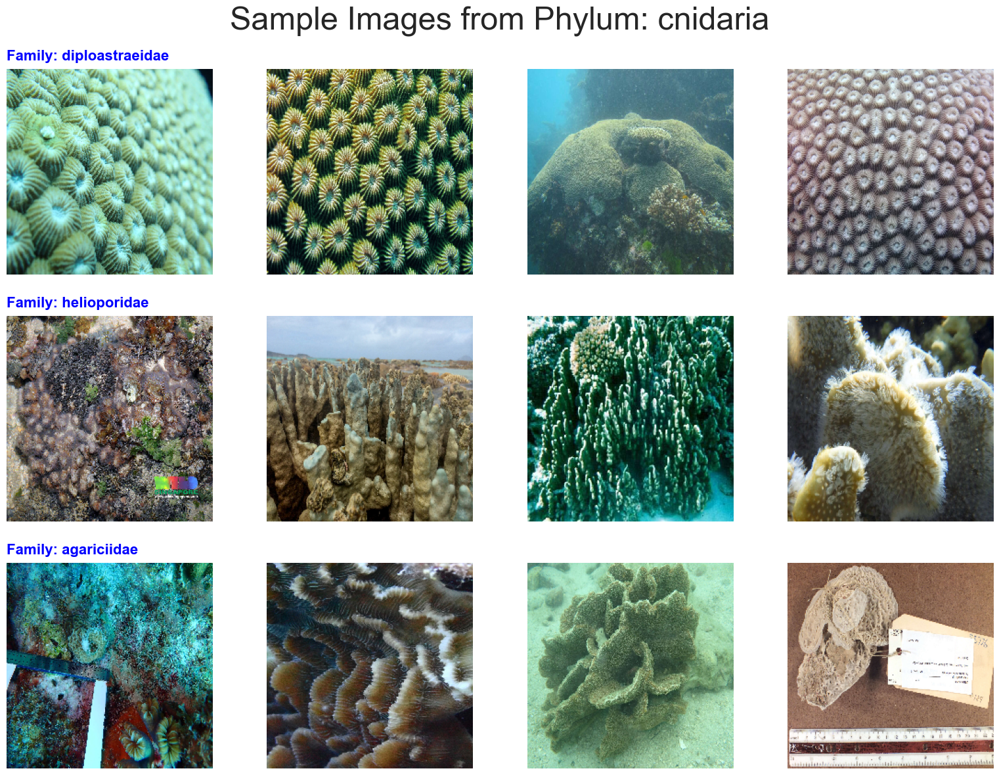

In [157]:
visualize_samples_by_phylum(train_dir, 'cnidaria')